## Find Frequency Distributions with NLTK (1)

#### Kernel: Python 2

Today we will be learning how to use the Natural Language Toolkit (NLTK) module to perform basic text analysis. 

NLTK is a Python add-on package which has multiple useful functions for analyzing text files. One key component of text analysis is finding keyword frequency distributions.

A frequency distribution can be shown as a table containing how many times within a document different words appear. To directly quote the NLTK book, “it’s called a "distribution" because it tells us how the total number of word tokens in the text are distributed across the vocabulary items. Since we often need frequency distributions in language processing, NLTK provides built-in support for them” (http://www.nltk.org/book/ch01.html). 

Let’s get started.


### Lab1:
1. String Manipulation 
2. tokenization 
3. stop words removal

### Lab2:
3. stemming 
4. POS
5. N-grams
6. Tfidf



## String Manipulation 

In [1]:
dir(str)

['__add__',
 '__class__',
 '__contains__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getnewargs__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__mod__',
 '__mul__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__rmod__',
 '__rmul__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'capitalize',
 'casefold',
 'center',
 'count',
 'encode',
 'endswith',
 'expandtabs',
 'find',
 'format',
 'format_map',
 'index',
 'isalnum',
 'isalpha',
 'isascii',
 'isdecimal',
 'isdigit',
 'isidentifier',
 'islower',
 'isnumeric',
 'isprintable',
 'isspace',
 'istitle',
 'isupper',
 'join',
 'ljust',
 'lower',
 'lstrip',
 'maketrans',
 'partition',
 'replace',
 'rfind',
 'rindex',
 'rjust',
 'rpartition',
 'rsplit',
 'rstrip',
 'split',
 'splitlines',
 'startswith',
 'strip',
 'swapcase',
 'title',
 'translate',
 'upper',


In [2]:
s = '  Hello '
s

'  Hello '

In [3]:
s = s.strip()
s

'Hello'

In [5]:
#string indexing 
s[0]

'e'

In [9]:
s[-1]

'o'

In [12]:
s[:4]

'Hell'

In [13]:
s = s.lower()
s

'hello'

In [14]:
s.isalpha()

True

In [15]:
s.isdigit()

False

In [16]:
s = 'http:\\www.abc.com'
s.startswith('http')

True

In [17]:
s = 'I love coding'
s_list = s.split() #default deliminator is ' '(space) 
s_list

['I', 'love', 'coding']

In [18]:
new_string = '$$'.join(s_list)
new_string

'I$$love$$coding'

In [21]:
s.replace(' ','')

'Ilovecoding'

## Read data

In [1]:
# install add-on Natural Language Processing toolkit
# you only need to run it once in your device
!pip install nltk

In [2]:
import nltk
from nltk import FreqDist

#read file from local

#method 1
f = open('input.txt','rb')
raw = f.read()
raw = raw.decode('utf8') #decode raw text by utf-8

#method 2
f = open('input.txt','r+')
raw = f.read()

In [6]:
type (raw)

str

In [9]:
raw = raw.replace('\n',' ') 
raw

'0|0|5|The Canon Rebel T3i takes the consumer level dSLR a couple steps closer to the mid-level Canon 60D with the addition of the rotating rear LCD screen, remote flash firing, and in-camera processing features.  The already highly competent, older Rebel T2i already shared many important features with the 60D (and even features of the semi-pro 7D) including the 18 MP sensor, 63-zone exposure metering system, high ISO performance, HD movie capabilities, and Digic 4 image processor.  With these new upgrades, it might make it even more difficult to choose between them.  But there are some important differences. If you are considering the Rebel T3i vs T2i, the Rebel T3i is replacing the T2i.  Since both cameras share the same 18 megapixel sensor and Digic 4 processor, both the T2i and T3i will create images with exactly the same image quality, produce the same low light/ high ISO performance, shoot at 3.7 frames per second, and have nearly the same size and build quality.  They are both o

## Tokenization 

In [8]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


True

In [10]:
tokens = nltk.word_tokenize(raw)
type(tokens)

list

In [11]:
#change all tokens into lower case 
words1 = [w.lower() for w in tokens]   #list comprehension 

#only keep text words, no numbers 
words2 = [w for w in words1 if w.isalpha()]

In [12]:
#another way to create a new list: 
words1 = []
for w in tokens: 
    words1.append(w.lower())


In [13]:
#generate a frequency dictionary for all tokens 
freq = FreqDist(words2)

#sort the frequency list in descending order
sorted_freq = sorted(freq.items(),key = lambda k:k[1], reverse = True)
sorted_freq

[('the', 164044),
 ('i', 88163),
 ('and', 79852),
 ('a', 74673),
 ('to', 73528),
 ('is', 52940),
 ('it', 51578),
 ('of', 44185),
 ('camera', 44018),
 ('for', 35840),
 ('this', 34050),
 ('with', 33926),
 ('you', 33652),
 ('in', 32513),
 ('that', 29868),
 ('my', 23395),
 ('have', 23057),
 ('on', 20712),
 ('but', 20543),
 ('not', 17837),
 ('are', 16349),
 ('as', 16115),
 ('was', 15144),
 ('lens', 13716),
 ('be', 13294),
 ('if', 12101),
 ('at', 11941),
 ('can', 11900),
 ('so', 11405),
 ('canon', 10873),
 ('nikon', 10782),
 ('or', 10752),
 ('very', 10709),
 ('do', 10362),
 ('more', 10218),
 ('all', 10130),
 ('use', 10116),
 ('great', 9948),
 ('an', 9226),
 ('from', 9152),
 ('has', 9135),
 ('will', 9134),
 ('good', 8584),
 ('get', 8542),
 ('like', 8541),
 ('me', 8449),
 ('one', 8319),
 ('just', 8251),
 ('quality', 8093),
 ('than', 8011),
 ('about', 7997),
 ('pictures', 7921),
 ('out', 7747),
 ('when', 7666),
 ('lenses', 7660),
 ('would', 7386),
 ('had', 7182),
 ('some', 6831),
 ('which', 641

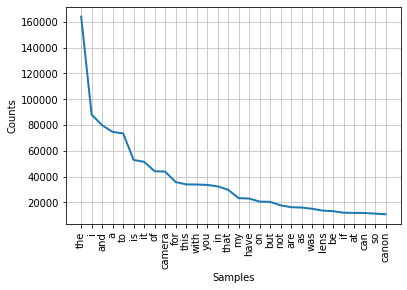

In [30]:
#If the this code does not show a figure, just try to run it twice
freq.plot(30)

## Stop words removal 

In [31]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ricardolu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [32]:
from nltk.corpus import stopwords

stopwords = stopwords.words('english') #use the NLTK stopwords

In [33]:
#only keep the words that not in nltk stopwords word list
words_nostopwords = [w for w in words2 if w not in stopwords]

In [34]:
#generate a frequency dictionary for all tokens 
freq_nostw = FreqDist(words_nostopwords)

#sort the frequency list in decending order
sorted_freq_nostw = sorted(freq_nostw.items(),key = lambda k:k[1], reverse = True)
sorted_freq_nostw

[('camera', 43970),
 ('lens', 13704),
 ('canon', 10862),
 ('nikon', 10775),
 ('use', 10113),
 ('great', 9934),
 ('good', 8571),
 ('get', 8541),
 ('like', 8533),
 ('one', 8312),
 ('quality', 8089),
 ('pictures', 7909),
 ('lenses', 7657),
 ('would', 7384),
 ('better', 6373),
 ('also', 5962),
 ('cameras', 5839),
 ('much', 5807),
 ('really', 5642),
 ('digital', 5604),
 ('take', 5393),
 ('time', 5272),
 ('iso', 5261),
 ('even', 5193),
 ('dslr', 5136),
 ('video', 5079),
 ('well', 5030),
 ('shoot', 5026),
 ('focus', 4807),
 ('still', 4549),
 ('used', 4514),
 ('image', 4504),
 ('flash', 4487),
 ('shots', 4460),
 ('light', 4447),
 ('using', 4419),
 ('photos', 4329),
 ('price', 4296),
 ('first', 4274),
 ('shooting', 4191),
 ('mode', 4134),
 ('slr', 4129),
 ('new', 4090),
 ('want', 4082),
 ('features', 3845),
 ('buy', 3795),
 ('point', 3726),
 ('photography', 3703),
 ('many', 3644),
 ('need', 3604),
 ('body', 3591),
 ('battery', 3509),
 ('easy', 3498),
 ('images', 3462),
 ('manual', 3428),
 ('kit

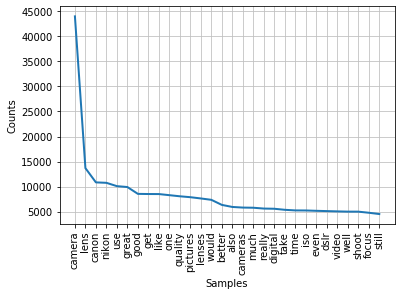

In [39]:
#If the this code does not show a figure, just try to run it twice
freq_nostw.plot(30)

## Save the result 

In [40]:
with open ('output.txt','a') as outfile:
    for line in sorted_freq_nostw:
        outfile.write(str(line[0])+'\t'+str(line[1])+'\n')

All done! Thanks for join me.